In [1]:
import evaluation.evaluation_plotting as evaluation_plotting
import model.EpidRLearn as EpidRLearn
import evaluation.Comparison as Comparison
import pandas as pd
import env_
from stable_baselines3 import PPO


## EpidRLearn

0
Using cpu device
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 26       |
|    ep_rew_mean     | -4.19    |
| time/              |          |
|    fps             | 901      |
|    iterations      | 1        |
|    time_elapsed    | 2        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 26          |
|    ep_rew_mean          | 5.09        |
| time/                   |             |
|    fps                  | 768         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.050998207 |
|    clip_fraction        | 0.4         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_var

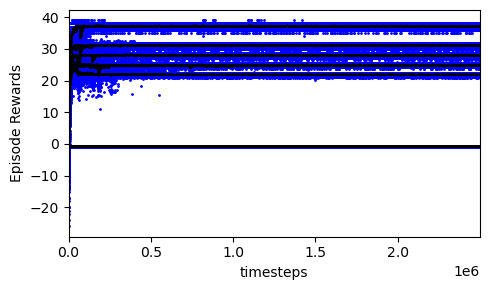

In [10]:
#if you want to retrain the model
for i in range(6):
    prob_id = i
    for j in range(2):
        rwd_id = j
        EpidRLearn.train(problem_id=prob_id, reward_id=rwd_id, model_name = f'model_{prob_id}_{rwd_id}', time_steps=2_500_00)
        
for i in range(6):
    prob_id = i
    for j in range(2):
        rwd_id = j
        EpidRLearn.train(problem_id=prob_id, reward_id=rwd_id, model_name = f'model_{prob_id}_{rwd_id}_10times', time_steps=2_500_000)

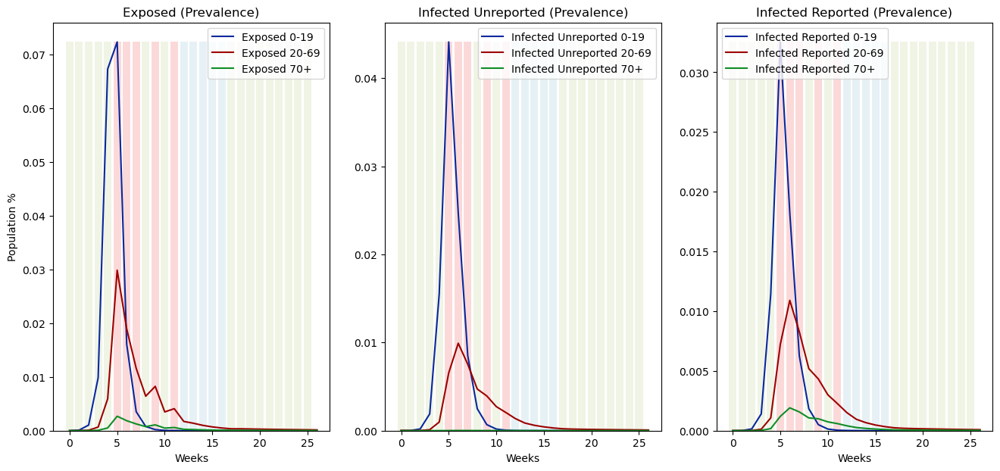

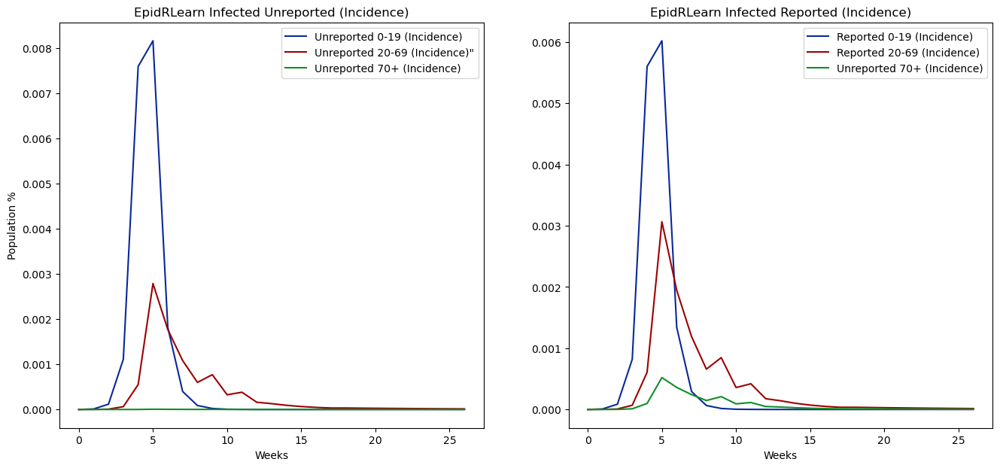

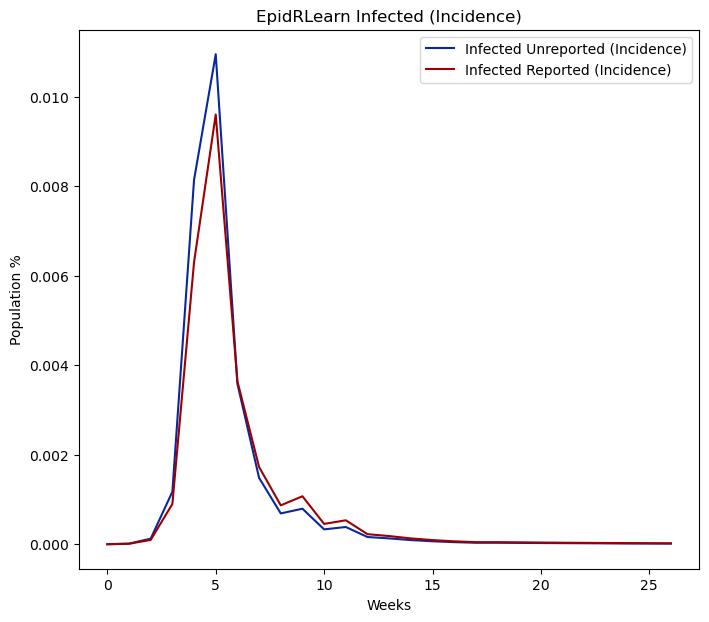

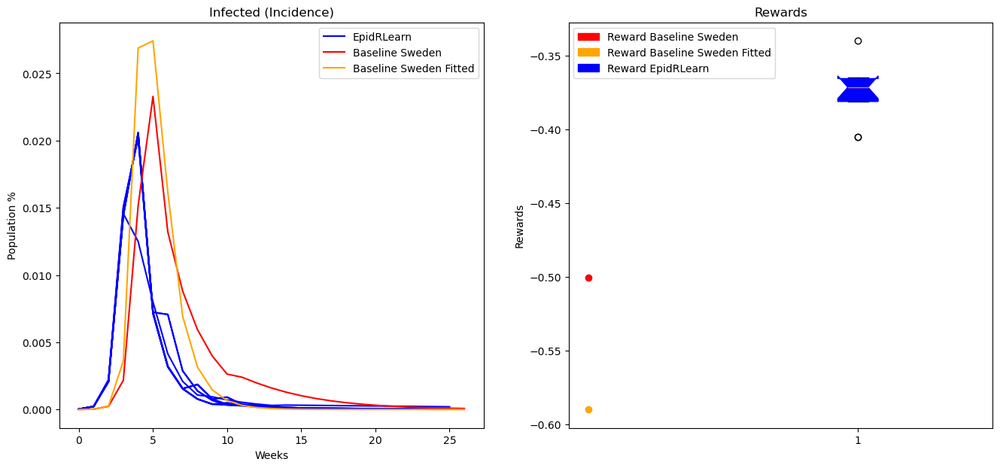

In [9]:
for i in range(6):
    prob_id = i
    rwd_id = 0
    
    model = PPO.load(f"temp/models/model_{prob_id}_{rwd_id}")
    period = 'autumn'

    envr = env_.Epidemic(problem_id = prob_id, reward_id=rwd_id, period = period)
    reward, actions = evaluation_plotting.evaluate(model, num_episodes=10, reward_id= rwd_id, problem_id = prob_id, period = period)

In [ ]:
## Comparison of rewards

#Comparison.train(problem_id=2, reward_id=[1], time_steps=250_000)


In [ ]:
#Comparison.evaluate_rewards(model_id=[0,1], num_episodes=1, reward_id=[0,1], problem_id=2, period='autumn')
#em0= pd.read_csv("Analysis_Files/exposed_model0.csv")
#em0.drop(['Unnamed: 0'], axis=1, inplace=True)
#em1= pd.read_csv("Analysis_Files/exposed_model1.csv")
#em1.drop(['Unnamed: 0'], axis=1, inplace=True)

#list_of_models = [em0, em1]

#Comparison.plot_reward_cases('012', list_of_models)